# Rapport Final IMA206

## Imports

In [ ]:
import pickle
import torch
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA
from IMA206_Face_Classifier.snippet import Classifier, attr_names
from torchvision.transforms import Resize, InterpolationMode
from sklearn.svm import SVR
import PIL
from PIL import Image
from projector import project
import os
from tqdm import tqdm

In [2]:
def format_img(img):
    img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).numpy().astype(np.uint8)
    return img.squeeze(0)

with open('pretrained/ffhq.pkl', 'rb') as f:
    G = pickle.load(f)['G_ema'].cuda()

## Style Mixing

Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.


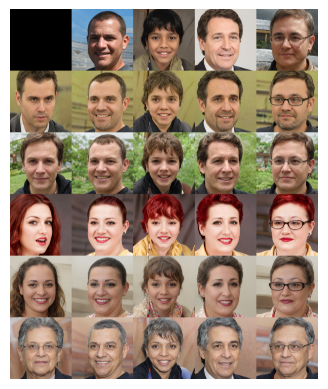

In [3]:
def generate_style_mix():
    row_seeds = [12,48,82,118,231]
    col_seeds = [15,762,891,1001]
    col_styles = np.arange(0,6)
    all_seeds = list(set(row_seeds + col_seeds))
    all_z = np.stack([np.random.RandomState(seed).randn(G.z_dim) for seed in all_seeds])
    all_w = G.mapping(torch.from_numpy(all_z).to("cuda"), None)
    w_avg = G.mapping.w_avg
    all_w = w_avg + (all_w - w_avg) * 0.7
    w_dict = {seed: w for seed, w in zip(all_seeds, list(all_w))}

    all_images = G.synthesis(all_w)
    all_images = (all_images.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8).cpu().numpy()
    image_dict = {(seed, seed): image for seed, image in zip(all_seeds, list(all_images))}

    for row_seed in row_seeds:
        for col_seed in col_seeds:
            w = w_dict[row_seed].clone()
            w[col_styles] = w_dict[col_seed][col_styles]
            image = G.synthesis(w[np.newaxis])
            image = (image.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
            image_dict[(row_seed, col_seed)] = image[0].cpu().numpy()

    W = G.img_resolution
    H = G.img_resolution
    canvas = PIL.Image.new('RGB', (W * (len(col_seeds) + 1), H * (len(row_seeds) + 1)), 'black')
    for row_idx, row_seed in enumerate([0] + row_seeds):
        for col_idx, col_seed in enumerate([0] + col_seeds):
            if row_idx == 0 and col_idx == 0:
                continue
            key = (row_seed, col_seed)
            if row_idx == 0:
                key = (col_seed, col_seed)
            if col_idx == 0:
                key = (row_seed, row_seed)
            canvas.paste(PIL.Image.fromarray(image_dict[key], 'RGB'), (W * col_idx, H * row_idx))
    plt.axis("off")
    plt.imshow(canvas)
    plt.show()
generate_style_mix()

Le vecteur de style des images de la première ligne remplace les 6 première dimensions du vecteur de style des images de la première colonne. 

## Variation Stochastiques

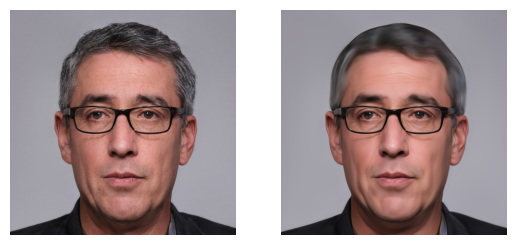

In [4]:
z = torch.randn([1, G.z_dim]).cuda()
w = G.mapping(z, None, truncation_psi=0.7)
img1 = G.synthesis(w)
img2 = G.synthesis(w, noise_mode="none")
plt.subplot(1,2,1)
plt.imshow(format_img(img1.cpu()))
plt.axis("off")
plt.subplot(1,2,2)
plt.imshow(format_img(img2.cpu()))
plt.axis("off")
plt.show()


L'image de droite est générée sans ajout de bruit dans StyleGAN, nous perdons les détails de l'image.

## Déplacement dans W

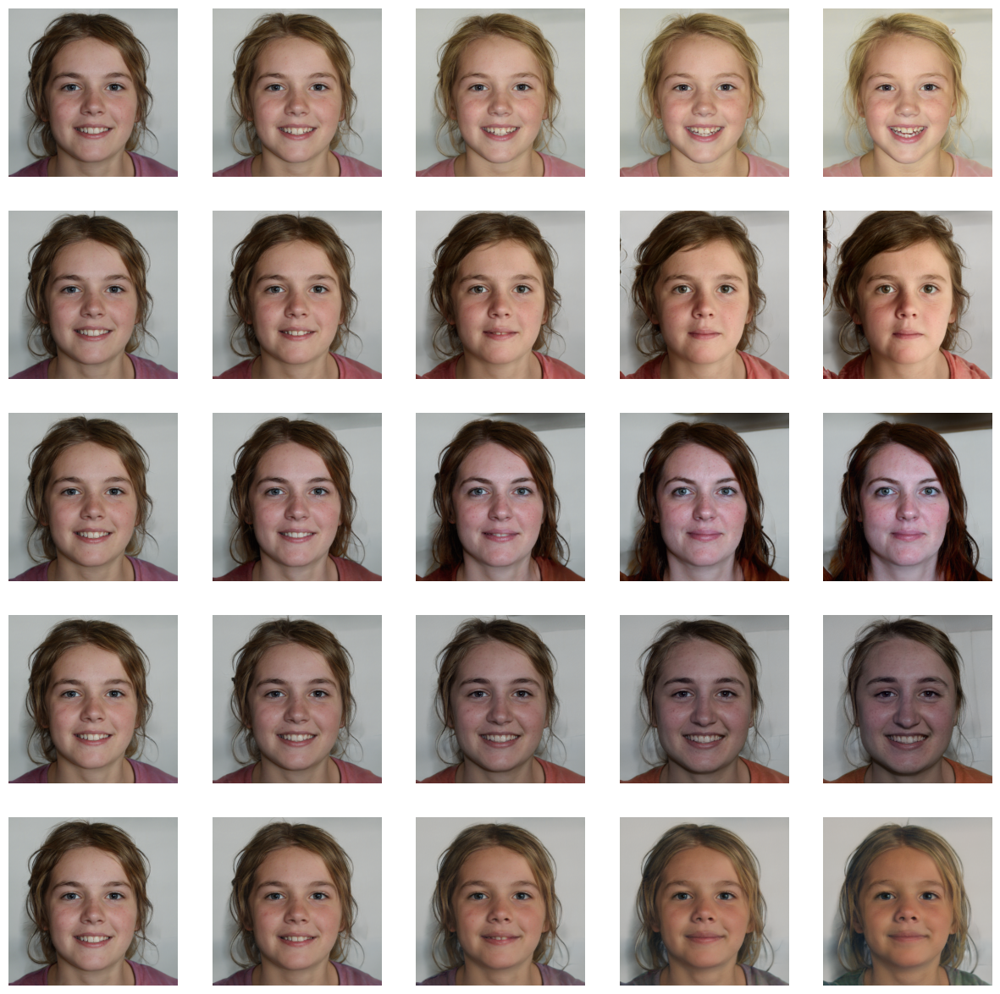

In [5]:
z = torch.randn([1, G.z_dim]).cuda()
w = G.mapping(z, None, truncation_psi=0.7)
img = G.synthesis(w)

plt.figure(figsize=(15,15))
cols = np.arange(0,10,2)
rows = np.arange(0,5,1)
for i, row_id in enumerate(rows):
    for j, col_id in enumerate(cols):
        w2 = w.detach().clone()
        w2[:,:,row_id] += col_id
        img2 = G.synthesis(w2)
        plt.subplot(len(cols),len(rows),i*len(cols) + j+1)
        plt.axis("off")
        plt.imshow(format_img(img2.cpu()))
plt.show()

Nous pouvons voir que dans l'espace W, modifier une dimension de l'espace revient à modifier des caractériqtiques sémantiques de l'image distinctes. Cependant, il n'est pas possible de prédire quelle caractéristique sera modifiée à l'avance.

## GanSpace

In [3]:
N = 1000
z = torch.randn([N, G.z_dim]).cuda()
w = G.mapping(z, None)
w = w.cpu()
w_one_dim = w[:,0,:]

pca = PCA()
pca.fit(w_one_dim)
U = np.repeat(pca.components_[:,None,:], 18, axis=1)

def show_images(x, U, layers, pca_dims, n, step_size):
    plt.figure(figsize=(15,15))
    for k,pca_dim in enumerate(pca_dims):
        step = torch.tensor(U[pca_dim]).to('cuda')
        for i in range(-n+1,n):
            x_modif = x.clone().detach()
            x_modif[layers] += (step_size * i * step)[layers]
            modif_img = G.synthesis(x_modif.unsqueeze(0))
            plt.subplot(len(pca_dims),2*n-1,i+n + k*len(pca_dims))
            plt.imshow(format_img(modif_img.cpu()))
            plt.axis('off')
    plt.show()

Setting up PyTorch plugin "bias_act_plugin"... Done.


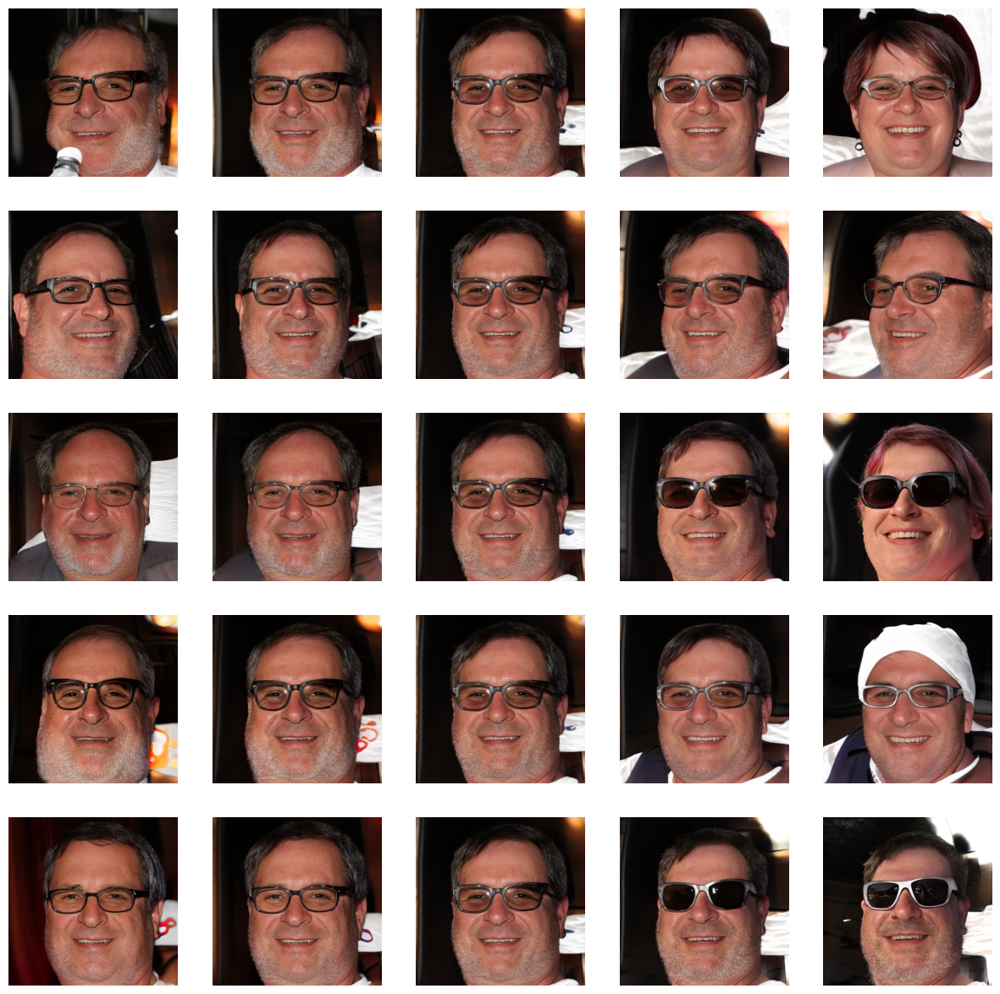

In [6]:
n = 3
step_size = 2
layers = np.arange(0,18)
pca_dims = np.arange(0,5)

z_new = torch.randn([1, G.z_dim]).cuda()
w_new = G.mapping(z_new,None)

show_images(w_new.squeeze(0),U,layers,pca_dims,n,step_size)

Nous appliquons une PCA sur 1000 points de l'espace W. Nous nous déplaçons sur les 5 premières directions de la PCA. Nous observons que ces directions sont très liées au sexe et à la position du visage. 

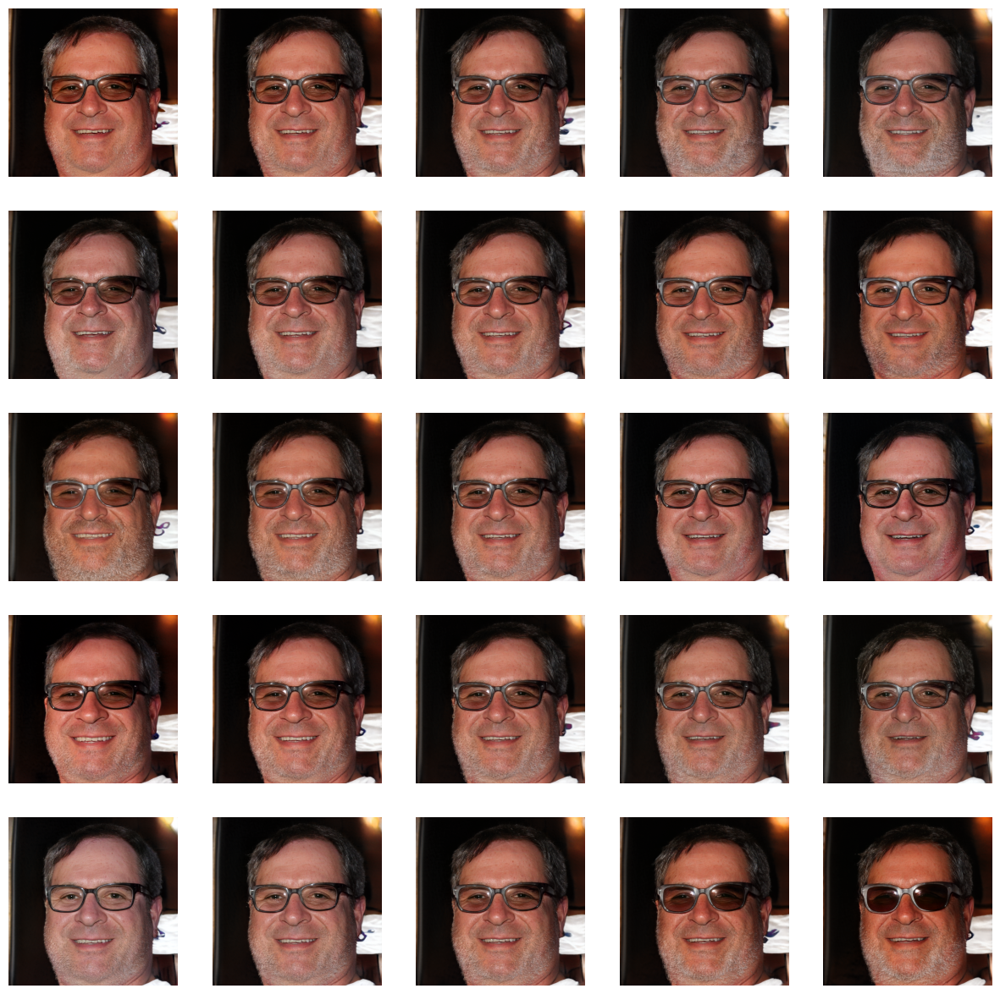

In [8]:
n = 3
step_size = 2
layers = np.arange(0,18)
pca_dims = np.arange(200,205)
show_images(w_new.squeeze(0),U,layers,pca_dims,n,step_size)

En modifiant l'image en suivant les directions 200 à 205 de la PCA, nous observons qu'aucune modification sémantique claire n'apparaît.

## InterfaceGan

In [11]:
attr = torch.ones(len(attr_names))
classifier = Classifier(attributes=attr, from_file='IMA206_Face_Classifier/classifier.pt', cuda=True)
classifier.requires_grad(False)
classifier.eval()

N=5000
s = torch.zeros((N,len(attr_names)))
z = torch.randn((N,G.z_dim)).cuda()
w = G.mapping(z, None)

transform = Resize(512, interpolation=InterpolationMode.BICUBIC, antialias=True)
for i,elt in enumerate(w):
    img = G.synthesis(elt.unsqueeze(0)).detach()
    img = transform((img * 127.5 + 128).clamp(0, 255))
    score = classifier(img)
    s[i] = score.cpu()

z = z.cpu()
w = w.cpu()
torch.save(z, 'z.pkl')
torch.save(w, 'w.pkl')
torch.save(s, 's.pkl')

In [12]:
newpath = "vecs"
if not os.path.exists(newpath):
    os.makedirs(newpath)

w = torch.load("w.pkl")
s = torch.load("s.pkl")

for i in range(len(attr_names)):
    s_i = s[:,i]
    perc_5 = int(N * (5/100))
    ordered_idx = torch.argsort(s_i)
    male_idx = ordered_idx[-perc_5:]
    female_idx = ordered_idx[:perc_5]
    all_idx = torch.cat((male_idx, female_idx))
    w_svr = w[:,0,:][all_idx]
    s_svr = s_i[all_idx]
    svr = SVR(kernel="linear")
    svr.fit(w_svr, s_svr)
    vec = torch.tensor(svr.coef_)
    vec /= vec.norm()
    torch.save(vec, f"vecs/vec_{attr_names[i].lower()}.pkl")

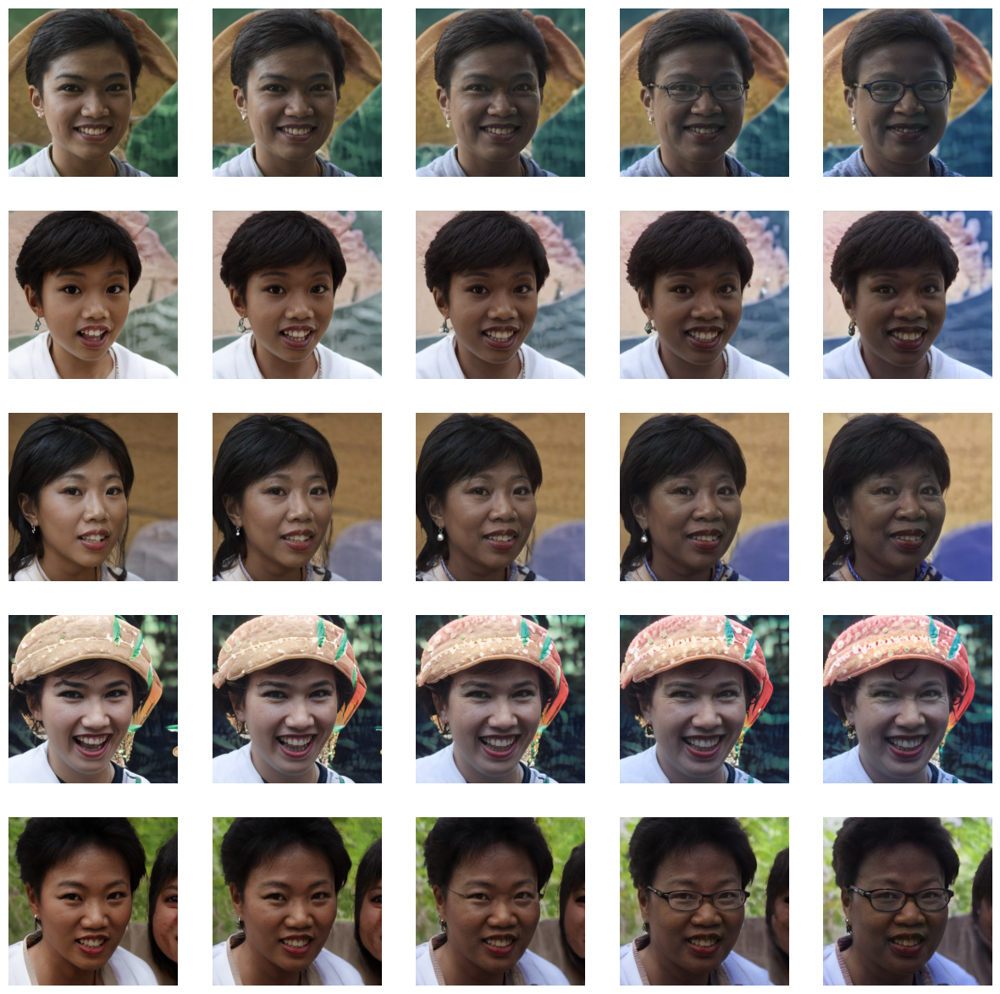

In [16]:
z_new = torch.rand((5,G.z_dim)).cuda()
w_new = G.mapping(z_new,None,truncation_psi=0.7)
vec = torch.load("vecs/vec_eyeglasses.pkl")

n = 5
step_size = 3

plt.figure(figsize=(15,15))
layers = np.arange(0,18)
for k,w_elt in enumerate(w_new):
    step = (step_size * vec).cuda()
    for i in range(0,n):
        x = w_elt.clone().detach().cuda()
        x[layers] += (i * step)
        modif_img = G.synthesis(x.unsqueeze(0))
        plt.subplot(5,n,1+i+k*5)
        plt.imshow(format_img(modif_img.cpu()))
        plt.axis('off')
plt.show()

Nous génèrons 5000 points dans l'espace W, pour chaque point, Nous génèrons l'image associée et on obtient un score avec le classficateur de lunette. Nous gardons 5% des points avec le plus haut score et 5% avec le plus bas score. Puis, nous appliquons un SVR sur ces 250 points. Nous récupèrons le vecteur directeur de l'hyperplan. En se déplaçant dans la direction du vecteur directeur sur de nouvelles images, nous parvenons à ajouter des lunettes aux visages par exemple.

In [12]:
newpath = "vecs_z"
if not os.path.exists(newpath):
    os.makedirs(newpath)

z = torch.load("z.pkl")
s = torch.load("s.pkl")
N = len(z)

for i in tqdm(range(len(attr_names))):
    s_i = s[:,i]
    perc_5 = int(N * (5/100))
    ordered_idx = torch.argsort(s_i)
    male_idx = ordered_idx[-perc_5:]
    female_idx = ordered_idx[:perc_5]
    all_idx = torch.cat((male_idx, female_idx))
    z_svr = z[all_idx]
    s_svr = s_i[all_idx]
    svr = SVR(kernel="linear")
    svr.fit(z_svr, s_svr)
    vec = torch.tensor(svr.coef_)
    vec /= vec.norm()
    torch.save(vec, f"vecs_z/vec_{attr_names[i].lower()}.pkl")

  2%|▎         | 1/40 [00:00<00:13,  2.98it/s]

100%|██████████| 40/40 [00:21<00:00,  1.86it/s]


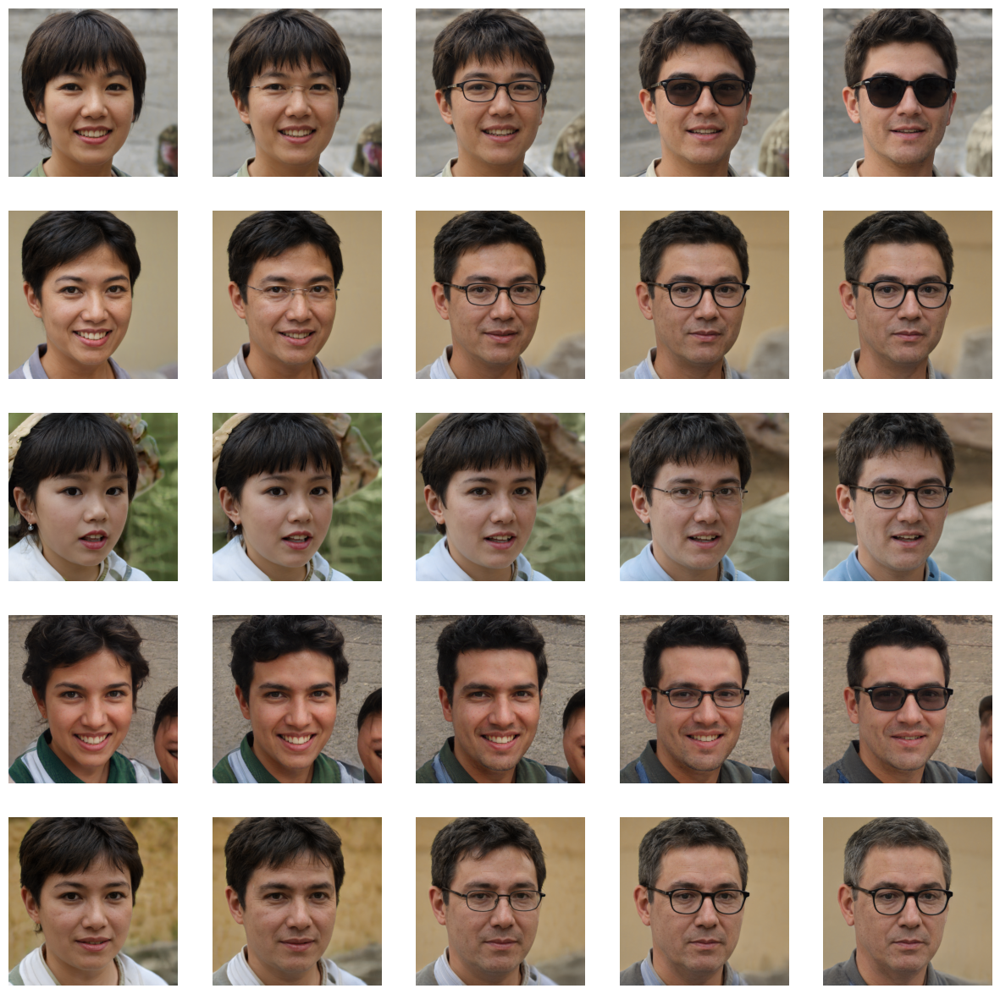

In [17]:
z_new = torch.rand((5,G.z_dim)).cuda()
w_new = G.mapping(z_new,None, truncation_psi=0.8)
vec = torch.load("vecs_z/vec_eyeglasses.pkl")

n = 5
step_size = 1

plt.figure(figsize=(15,15))
for k,z_elt in enumerate(z_new):
    step = (step_size * vec).cuda()
    for i in range(0,n):
        x = z_elt.clone().detach().unsqueeze(0).cuda()
        x += (i * step)
        w_elt = G.mapping(x, None, truncation_psi=0.5)
        modif_img = G.synthesis(w_elt)
        plt.subplot(5,n,1+i+k*5)
        plt.imshow(format_img(modif_img.cpu()))
        plt.axis('off')
plt.show()

Dans l'espace latent les attributs sont plus corrélés.

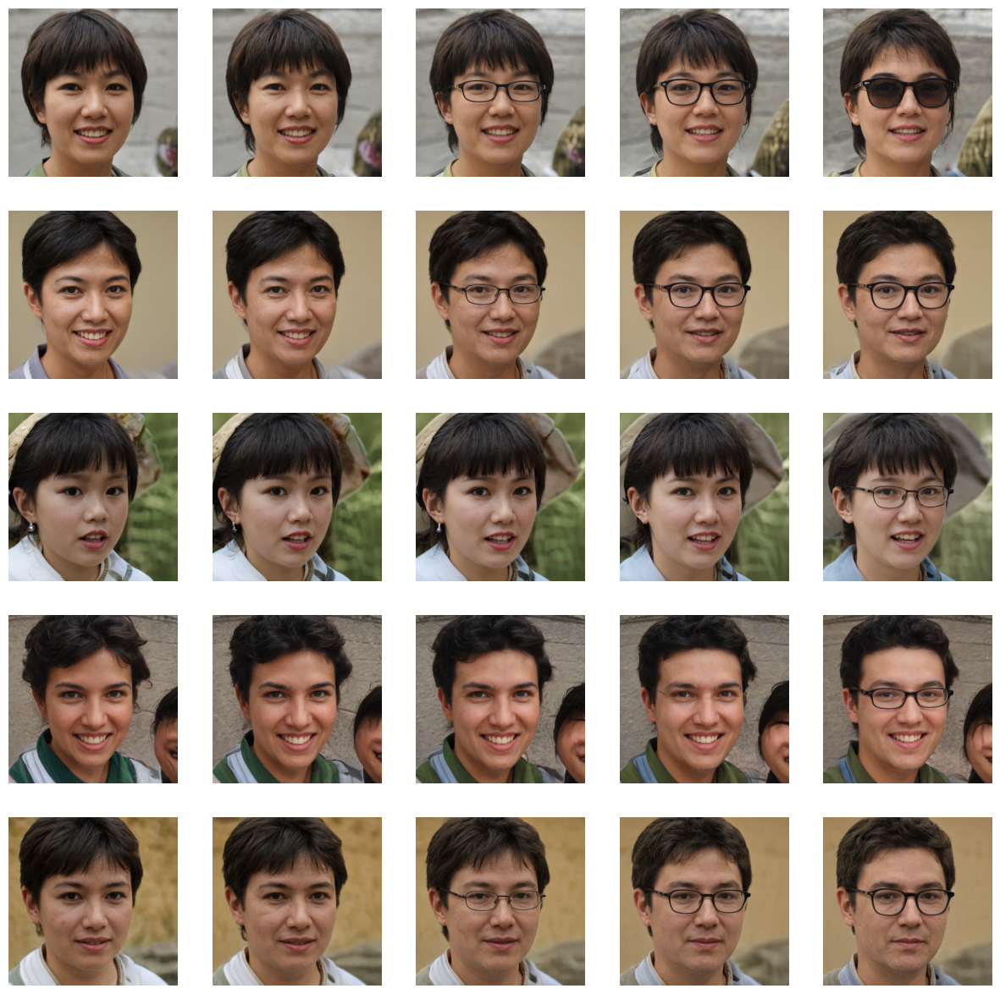

In [18]:
vec1 = torch.load("vecs_z/vec_eyeglasses.pkl")
vec2 = torch.load("vecs_z/vec_male.pkl")
vec3 = torch.load("vecs_z/vec_gray_hair.pkl")

vec_disentangled = vec1 - (vec1 @ vec2.T) * vec2 - (vec1 @ vec3.T) * vec3
vec_disentangled /= vec_disentangled.norm()

n = 5
step_size = 1

plt.figure(figsize=(15,15))
for k,z_elt in enumerate(z_new):
    step = (step_size * vec_disentangled).cuda()
    for i in range(0,n):
        x = z_elt.clone().detach().unsqueeze(0).cuda()
        x += (i * step)
        w_elt = G.mapping(x, None, truncation_psi=0.5)
        modif_img = G.synthesis(w_elt)
        plt.subplot(5,n,1+i+k*5)
        plt.imshow(format_img(modif_img.cpu()))
        plt.axis('off')
plt.show()

Après décorrélation, les résultats sont meilleurs.

In [ ]:
all_vecs = torch.zeros((40,512))
for i,name in enumerate(attr_names):
    all_vecs[i] = torch.load(f"vecs/vec_{name.lower()}.pkl")

all_vecs_z = torch.zeros((40,512))
for i,name in enumerate(attr_names):
    all_vecs_z[i] = torch.load(f"vecs_z/vec_{name.lower()}.pkl")

corr_mat = np.zeros((40,40))
corr_mat_z = np.zeros((40,40))

for i in range(40):
    for j in range(40):
        corr_mat[i,j] = all_vecs[i].T @ all_vecs[j] / (all_vecs[i].norm() * all_vecs[j].norm())
        corr_mat_z[i,j] = all_vecs_z[i].T @ all_vecs_z[j] / (all_vecs_z[i].norm() * all_vecs_z[j].norm())

plt.matshow(corr_mat)
plt.colorbar(fraction=0.046, pad=0.04)
plt.title("Matrice de corrélation des attributs dans W")
plt.savefig("corr.png")
plt.show()
plt.matshow(corr_mat_z)
plt.colorbar(fraction=0.046, pad=0.04)
plt.title("Matrice de corrélation des attributs dans Z")
plt.savefig("corr_z.png")
plt.show()

## Projection et modification d'un visage réel

Dans cette partie nous souhaithons projeter un visage réel dans l'espace W grâce au fichier projector.py et modifier certains attributs de ce visage.

In [17]:
img_orig = Image.open('ivan.png')

In [ ]:
img_tensor = torch.from_numpy(np.array(img_orig))
img_tensor = img_tensor.permute(2, 0, 1)

w_ivan = project(G, img_tensor, device='cuda')
torch.save(w_ivan[-1], 'w_ivan.pkl')

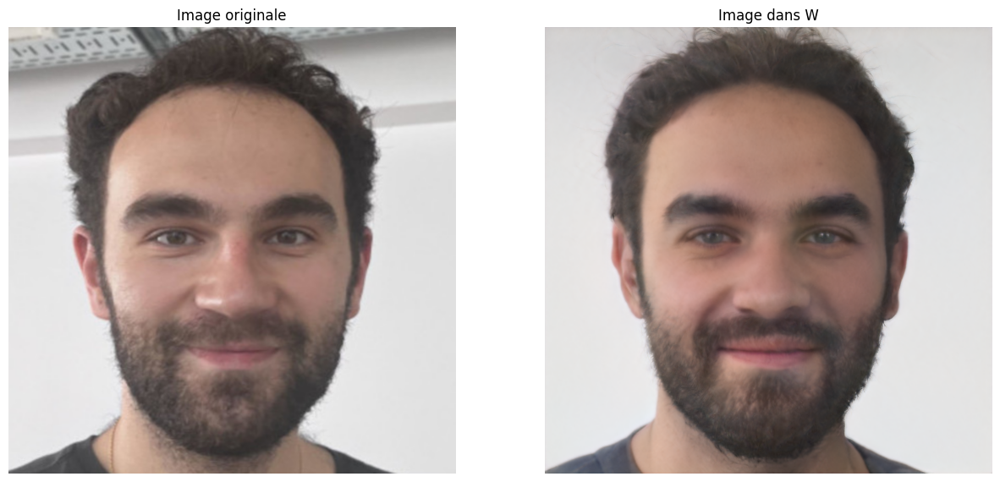

In [19]:
w_ivan = torch.load('w_ivan.pkl')
img_w = G.synthesis(w_ivan.unsqueeze(0))
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.imshow(img_orig)
plt.title("Image originale")
plt.axis("off")
plt.subplot(1,2,2)
plt.imshow(format_img(img_w.cpu()))
plt.title("Image dans W")
plt.axis("off")
plt.show()

Nous avons aligné l'image d'Ivan pour que celle-ci ait un alignement identique avec les images du dataset ffhq. Cela permet d'améliorer la projection qui est assez réaliste.

In [20]:
all_vecs = torch.zeros((40,512))
for i,name in enumerate(attr_names):
    all_vecs[i] = torch.load(f"vecs/vec_{name.lower()}.pkl")

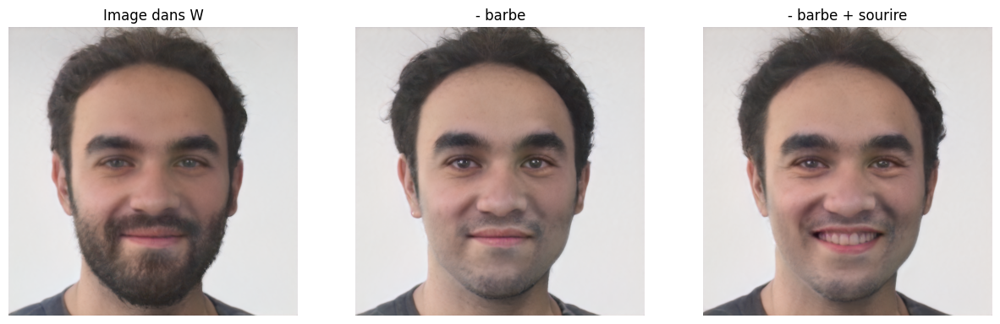

In [21]:
idx1 = attr_names.index('Smiling')
idx2 = attr_names.index('No_Beard')
x = w_ivan.clone().detach().cuda()
vec1 = all_vecs[idx1].cuda()
vec2 = all_vecs[idx2].cuda()
x_no_beard = x + 7 * vec2
x_smile = x_no_beard + 3 * vec1

img_no_beard= G.synthesis(x_no_beard.unsqueeze(0))
img_woman= G.synthesis(x_smile.unsqueeze(0))
plt.figure(figsize=(15,15))
plt.subplot(1,3,1)
plt.imshow(format_img(img_w.cpu()))
plt.title("Image dans W")
plt.axis("off")
plt.subplot(1,3,2)
plt.imshow(format_img(img_no_beard.cpu()))
plt.title("- barbe")
plt.axis("off")
plt.subplot(1,3,3)
plt.imshow(format_img(img_woman.cpu()))
plt.title("- barbe + sourire")
plt.axis("off")
plt.show()

Nous retirons la barbe et ajoutons un sourire à l'image. Le résultat n'est pas parfait mais correspond aux modifications souhaitées.

## Générer un visage avec certains attributs

Notre but dans cette partie est de pouvoir générer un visage avec une certaine caractéristique avec stylegan. Cela revient à cartographier l'espace W et de connaître les zones de cet espace correspondant à des visages ayant un certain attribut.

### Premier essai: déplacement en partant du visage moyen

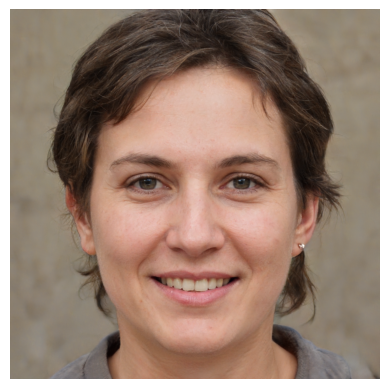

In [22]:
w = torch.load("w.pkl").cuda()
w_mean = torch.mean(w, dim=0)
img = G.synthesis(w_mean.unsqueeze(0))
plt.imshow(format_img(img.cpu()))
plt.axis("off")
plt.show()

Nous commençons par calculer le visage moyen de nos 5000 images générées. Nous pouvons voir que celui-ci est androgyne, a des cheveux mi-long etc... Cela est cohérent, c'est un visage le plus neutre possible.

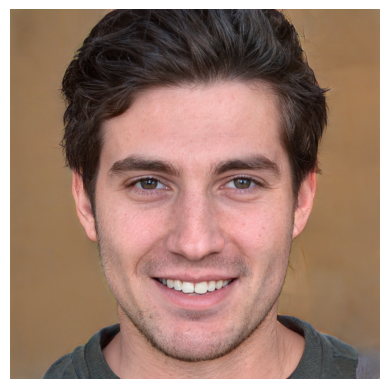

In [23]:
idx = attr_names.index("Male")
vec = all_vecs[idx] / all_vecs[idx].norm()
eps = torch.empty(512).normal_(mean=0,std=0.3)
w_modif = w_mean + 5 * vec.cuda() + eps.cuda()
img = G.synthesis(w_modif.unsqueeze(0))
plt.imshow(format_img(img.cpu()))
plt.axis("off")
plt.show()

Ensuite, nous décidons de nous déplacer dans l'espace W selon un des vecteurs calculé dans la partie interfaceGan à partir du visage moyen.
Afin d'obtenir un visage nouveau et non pas le visage moyen modifié, nous ajoutons une perturbation gaussienne à notre vecteur translaté.
Cette modification a pour effet de trouver un nouveau point dans une partie de l'espace W correspondant à des visages ayant une certaine caractéristique.

Nous voyons avec cet exemple que le visage est différent d'une simple version masculanisée du visage moyen mais certaines caractéristiques du visage moyen demeures comme le nez par exemple.

### Second essai: KMeans dans l'espace W

Dans ce second essai, nous adoptons une stratégie différente en exploitant l'algorithme de K-moyennage.

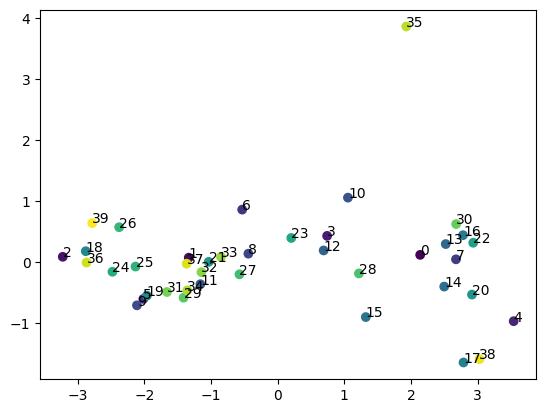

In [24]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

perc_5 = int(len(w) * 5 / 100)
scores = torch.load("s.pkl")
centroids = np.zeros((40,512))
for i,s in enumerate(scores.T):
    s_sort = torch.argsort(s)
    s_idxs = s_sort[-perc_5:]
    w_idxs = w[s_idxs,0,:].cpu()
    centroids[i] = torch.mean(w_idxs, dim=0)

def addlabels(x,y):
    for i in range(len(x)):
        plt.text(x[i],y[i],i)

pca = PCA(n_components=2)
centroids_pca = pca.fit_transform(centroids)
x = centroids_pca[:,0]
y = centroids_pca[:,1]
addlabels(x,y)
plt.scatter(x,y, c=np.arange(0,40))
plt.show()

In [25]:
for elt in [4,6,10,35]:
    print(attr_names[elt])

Bald
Big_Lips
Blurry
Wearing_Hat


Pour chaque attribut, nous prenons les points de W qui obtiennent le plus haut score après classification et nous calculons leur vecteur moyen. Ensuite, nous appliquons une PCA 2D sur ces vecteurs moyens. Nous plotons le résultat de la PCA et observons la répartition des attributs du dataset CelebA. Certains attributs sont très discernables dans la PCA et cela correspond à des caractéristiques très visibles comme le port d'un chapeau. Nous parvenons de cette manière à établir une cartographie de l'espace W en obtenant les centroïdes de régions de l'espace correspondant à un attribut donné.

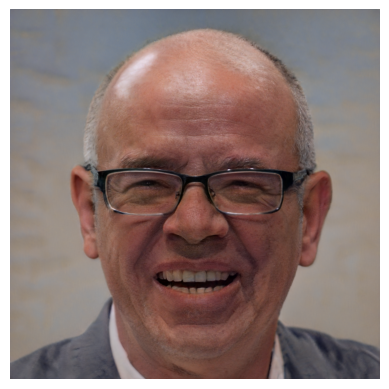

In [26]:
eps = torch.empty(512).normal_(mean=0,std=0.5)
idx = attr_names.index("Male")
new_w = (torch.tensor(centroids[idx]) + eps)[None,:].repeat(18,1).cuda()
img = G.synthesis(new_w.unsqueeze(0))
plt.imshow(format_img(img.cpu()))
plt.axis("off")
plt.show()

Pour finir, nous sélectionnons le centroïde d'un certain attribut et nous ajoutons une perturbation gaussienne pour obtenir un visage possédent l'attribut souhaité sans avoir besoin d'effectuer de translation.